In [3]:
import os
import pandas as pd
import nltk
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
from IPython.display import display, HTML
import logging
import tomotopy as tp
from ast import literal_eval
from pyvis.network import Network
from datetime import datetime as dt

logging.basicConfig(
    format="%(asctime)s : %(levelname)s : %(message)s", level=logging.INFO
)


In [4]:
# Load ECB preprocessed speech
speech = pd.read_csv(
    "Data/Processed/preprocessed_dataframe.csv",
    index_col=0,
    converters={"Tokens": literal_eval},
)
speech.tail()


,session_nr,year,country,Text,Tokens,Joined_Tokens,Global Code,Global Name,Region Code,Region Name,...,Developed / Developing Countries,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,55,2000,IDN,it gives me great\npleasure to congratulate mr...,"[great, pleasure, congratulate, holkeri, assum...",great pleasure congratulate holkeri assumption...,1.0,World,142.0,Asia,...,Developing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,55,2000,MCO,"allow\nme, first of all, to congratulate you m...","[allow, congratulate, warmly, president, elect...",allow congratulate warmly president election p...,1.0,World,150.0,Europe,...,Developed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,55,2000,BHR,"it is my\ngreat pleasure to congratulate you, ...","[great, pleasure, congratulate, president, ele...",great pleasure congratulate president election...,1.0,World,142.0,Asia,...,Developing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,55,2000,AND,"andorra will\nbecome, through the western euro...","[andorra, become, western, others, group, weog...",andorra become western others group weog rotat...,1.0,World,150.0,Europe,...,Developed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,55,2000,GAB,i welcome\nthe opportunity and the honour affo...,"[opportunity, honour, afford, speak, behalf, g...",opportunity honour afford speak behalf gabon s...,1.0,World,2.0,Africa,...,Developing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Train LDA/CTM model
tokens = speech["Tokens"].sum()

mdl = tp.CTModel(k=10)
mdl.add_doc(tokens)

for i in range(0, 100, 10):
    mdl.train(100)
    print("Iteration: {}\tLog-likelihood: {}".format(i, mdl.ll_per_word))

for k in range(mdl.k):
    print("Top 10 words of topic #{}".format(k))
    print(mdl.get_topic_words(k, top_n=10))

mdl.summary()


In [18]:
# Visualise LDA model
topic_term_dists = np.stack([mdl.get_topic_word_dist(k) for k in range(mdl.k)])
doc_topic_dists = np.stack([doc.get_topic_dist() for doc in mdl.docs])
doc_topic_dists /= doc_topic_dists.sum(axis=1, keepdims=True)
doc_lengths = np.array([len(doc.words) for doc in mdl.docs])
vocab = list(mdl.used_vocabs)
term_frequency = mdl.used_vocab_freq

# prepared_data = pyLDAvis.prepare(
#     topic_term_dists,
#     doc_topic_dists,
#     doc_lengths,
#     vocab,
#     term_frequency,
#     start_index=0,  # tomotopy starts topic ids with 0, pyLDAvis with 1
#     sort_topics=False,  # IMPORTANT: otherwise the topic_ids between pyLDAvis and tomotopy are not matching!
# )
# pyLDAvis.save_html(prepared_data, "ctmodelvis.html")


/Users/lanchu/miniforge3/envs/machine-learning/lib/python3.9/site-packages/pyLDAvis/_prepare.py:243: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


In [7]:
#check cohenrence score per topic
for preset in ('u_mass', 'c_uci', 'c_npmi', 'c_v'):
    coh = tp.coherence.Coherence(mdl, coherence=preset)
    average_coherence = coh.get_score()
    coherence_per_topic = [coh.get_score(topic_id=k) for k in range(mdl.k)]
    print('==== Coherence : {} ===='.format(preset))
    print('Average:', average_coherence, '\nPer Topic:', coherence_per_topic)


==== Coherence : u_mass ====
Average: -1.1102230246251565e-16 
Per Topic: [-1.1102230246251565e-16, -1.1102230246251565e-16, -1.1102230246251565e-16, -1.1102230246251565e-16, -1.1102230246251565e-16, -1.1102230246251565e-16, -1.1102230246251565e-16, -1.1102230246251565e-16]
==== Coherence : c_uci ====
Average: -0.08923611820071764 
Per Topic: [-0.14909134575470373, -0.06565674737291867, -0.06843754295602857, -0.11093279344920097, -0.06070489253727342, -0.02546622954822624, -0.16380624149193565, -0.06979315249545397]
==== Coherence : c_npmi ====
Average: -0.007280539338488944 
Per Topic: [-0.018237096367151664, -0.0008710050779751807, -0.006380773680306475, -0.010601912180834954, 0.0020553807546325174, -0.0022817144819689914, -0.01808664317567466, -0.0038405504986321467]
==== Coherence : c_v ====
Average: 0.36850878861732783 
Per Topic: [0.34865283221006393, 0.3762153070420027, 0.36632380336523057, 0.3578846424818039, 0.39479958862066267, 0.36516083776950836, 0.35766248777508736, 0.3813

In [8]:
coherence_scores = []
for k in range(5, 21):
    # train the LDA model with the current number of topics
    mdl = tp.LDAModel(k=k)
    mdl.add_doc(tokens)
    mdl.train(200)

    # calculate the coherence score for the model using 'c_v'
    coh = tp.coherence.Coherence(mdl, coherence='c_v')
    coherence_score = coh.get_score()
    coherence_scores.append((k, coherence_score))

coherence_scores.sort(key=lambda x: x[1], reverse=True)

for k, score in coherence_scores[:11]:
    print(f"Number of topics: {k}, Coherence score: {score}")


Number of topics: 5, Coherence score: 0.3849896517395973
Number of topics: 8, Coherence score: 0.3822514241561294
Number of topics: 4, Coherence score: 0.37978747226297854
Number of topics: 7, Coherence score: 0.37510167828627994
Number of topics: 6, Coherence score: 0.36894132296244303
Number of topics: 10, Coherence score: 0.3545942774787546
Number of topics: 9, Coherence score: 0.35439413703150224


Corehence score does not seem to change much, maybe only when there is big number of topics
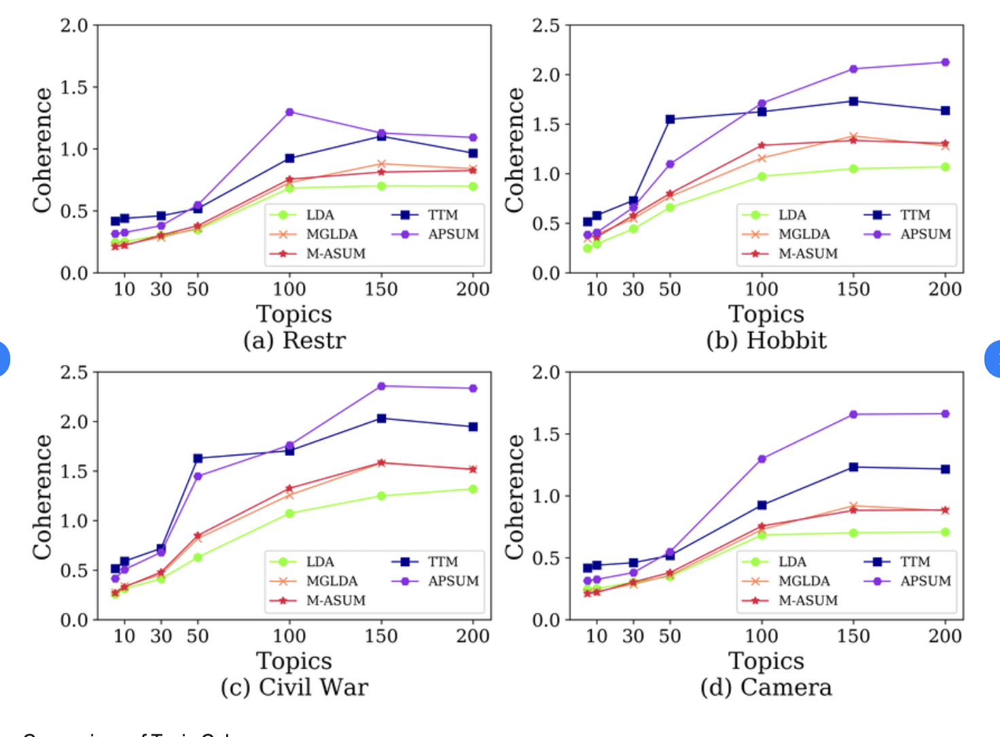

### Dynamic topic modelling

In [1]:
speech.groupby['year'].sum()['Joined_Tokens']

NameError: name 'speech' is not defined

In [20]:
speech = speech[~speech["Joined_Tokens"].isnull()].reset_index(drop=True)
speech["timepoint"] = speech.index

def data_feeder(df):
    for index, row in df.iterrows():
        tokens = [token for token in row["Tokens"]]
        yield " ".join(tokens), None, {"timepoint": row["timepoint"]}


corpus = tp.utils.Corpus(tokenizer=tp.utils.SimpleTokenizer())
corpus.process(data_feeder(speech))


268

The optimal time slice length depends on the specifics of data and may require some experimentation to find the best choice.

The PMI scheme measures the degree of association between each term and each document in the dataset. It takes into account the frequency of the term in the document, as well as the frequency of the term in the entire dataset. Terms that have a high PMI score are considered to be strongly associated with the document, while terms with a low PMI score are considered to be weakly associated. This can help to identify important terms that are specific to each document

In [21]:
# Train DTM model
mdl = tp.DTModel(
    min_cf=3,
    k=8,
    t=268,
    corpus=corpus,
    rm_top=1,
    # alpha_var="auto",
    # eta_var="auto",
    tw=tp.TermWeight.IDF,

)
mdl.train(100) # 10 iterations where model goes through the whole corpus 10 times

print(
    "Num docs:{}, Num Vocabs:{}, Total Words:{}".format(
        len(mdl.docs), len(mdl.used_vocabs), mdl.num_words
    )
)
print("Removed Top words: ", *mdl.removed_top_words)

for i in range(0, 1000, 20):
    print("Iteration: {:04}, LL per word: {:.4}".format(i, mdl.ll_per_word))
    mdl.train(20)
print("Iteration: {:04}, LL per word: {:.4}".format(1000, mdl.ll_per_word))

mdl.summary()

topic_dist_by_time = np.zeros(shape=[mdl.num_timepoints, mdl.k], dtype=float)
for doc in mdl.docs:
    topic_dist_by_time[doc.timepoint] += doc.get_topic_dist()

topic_dist_by_time /= mdl.num_docs_by_timepoint[:, np.newaxis]


Num docs:268, Num Vocabs:2380, Total Words:172720
Removed Top words:  growth
Iteration: 0000, LL per word: -2.094
Iteration: 0020, LL per word: -2.078
Iteration: 0040, LL per word: -2.066
Iteration: 0060, LL per word: -2.06
Iteration: 0080, LL per word: -2.053
Iteration: 0100, LL per word: -2.048
Iteration: 0120, LL per word: -2.042
Iteration: 0140, LL per word: -2.032
Iteration: 0160, LL per word: -2.02
Iteration: 0180, LL per word: -2.013
Iteration: 0200, LL per word: -2.003
Iteration: 0220, LL per word: -1.996
Iteration: 0240, LL per word: -1.99
Iteration: 0260, LL per word: -1.983
Iteration: 0280, LL per word: -1.978
Iteration: 0300, LL per word: -1.972
Iteration: 0320, LL per word: -1.97
Iteration: 0340, LL per word: -1.966
Iteration: 0360, LL per word: -1.962
Iteration: 0380, LL per word: -1.959
Iteration: 0400, LL per word: -1.953
Iteration: 0420, LL per word: -1.952
Iteration: 0440, LL per word: -1.948
Iteration: 0460, LL per word: -1.948
Iteration: 0480, LL per word: -1.942
It

In [22]:
for t in range(mdl.num_timepoints):
    for k in range(mdl.k):
        print("Top 10 words of topic #{}".format(k))
        print(mdl.get_topic_words(k, timepoint = t,top_n=10))


Top 10 words of topic #0
[('ii', 0.03704433888196945), ('iii', 0.027946611866354942), ('subscription', 0.023763282224535942), ('iv', 0.023750267922878265), ('govern', 0.02374912053346634), ('decentralise', 0.02224406599998474), ('site', 0.02224094606935978), ('replace', 0.02107120491564274), ('format', 0.020115209743380547), ('transfer', 0.018613843247294426)]
Top 10 words of topic #1
[('emi', 0.03312472254037857), ('banknote', 0.02957839146256447), ('accordance', 0.020923612639307976), ('statute', 0.01937958598136902), ('appoint', 0.019377658143639565), ('nine', 0.017785213887691498), ('recall', 0.01761716417968273), ('administration', 0.0166634414345026), ('arrangement', 0.015790263190865517), ('national', 0.015195675194263458)]
Top 10 words of topic #2
[('escb', 0.0364222414791584), ('intraday', 0.0241482425481081), ('silguy', 0.02261175774037838), ('method', 0.021429480984807014), ('specification', 0.020455965772271156), ('consist', 0.019633349031209946), ('ii', 0.01895160973072052

In [23]:
df = pd.DataFrame(topic_dist_by_time)
df.index = pd.to_datetime(speech["Date"])
df


,0,1,2,3,4,5,6,7
Date,,,,,,,,
1998-06-09,0.138444,0.185408,0.136166,0.105392,0.120975,0.098420,0.086457,0.128743
1998-07-08,0.101956,0.108353,0.175584,0.097470,0.141395,0.141549,0.110043,0.123658
1998-09-11,0.091757,0.107404,0.122786,0.188231,0.129068,0.118422,0.094777,0.147559
1998-10-13,0.108823,0.128228,0.110561,0.149673,0.128341,0.140315,0.107218,0.126842
1998-11-03,0.067331,0.139277,0.092935,0.217978,0.145134,0.172439,0.082885,0.082020
...,...,...,...,...,...,...,...,...
2022-07-21,0.105110,0.187924,0.142532,0.098865,0.081124,0.085645,0.184160,0.114642
2022-09-08,0.130676,0.113617,0.152447,0.148877,0.079994,0.093158,0.169304,0.111927
2022-10-27,0.138305,0.117155,0.118807,0.100119,0.095138,0.125433,0.184056,0.120988


In [24]:
# from matplotlib.ticker import StrMethodFormatter
# plt.figure(figsize=(12,8))

# plt.stackplot(
#     df.index, *[100 * df[i] for i in df.columns], labels=list(range(len(df.columns)))
# )
# plt.legend(loc = 'upper center', bbox_to_anchor=(0.5, -0.1), ncol=5)
# plt.xlim(df.index[0], df.index[-1])
# plt.ylim(0, 100)
# plt.gca().yaxis.set_major_formatter(StrMethodFormatter("{x:2.0f}%"))
# plt.xlabel("Date [Year]")
# plt.ylabel("")
# plt.show()
import plotly.graph_objs as go
from plotly.subplots import make_subplots

fig = make_subplots()

# create traces for each stack
for i, col in enumerate(df.columns):
    trace = go.Scatter(x=df.index, y=100*df[col], name=str(i), mode='lines', stackgroup='one')
    fig.add_trace(trace)

fig.update_layout(
    xaxis_title="Date [Year]",
    yaxis_title="",
    yaxis_range=[0,100],
    showlegend=True,
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
)

fig.show()


/Users/lanchu/miniforge3/envs/machine-learning/lib/python3.9/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

/Users/lanchu/miniforge3/envs/machine-learning/lib/python3.9/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



### find the top words (highest probability) for each topics across the time slice by:

Step 1. Create a three-dimensional array topic_word_dists with dimensions num_topics, mdl.num_timepoints, and num_words. This array will hold the word distribution of each topic across all time slices.  

Step 2. Loop over each time slice in the model and for each topic, get its word distribution using the get_topic_word_dist() method and store it in the topic_word_dists.


Step 3. Aggregate the word distributions across all time slices by taking the sum  of probability of each words in all time slices. The result is a two-dimensional array with dimensions topic and words probabilities.


Step 4. Normalize the word distribution for each topic by dividing by the sum of the distribution, so that the probabilities add up to 1.  

Step 5. For each topic, get the indices of the num_top_words words with the highest probability in the normalized distribution using argsort(). 


In [118]:
for timeslice in range(265,268):
    print (mdl.get_topic_words(1,timeslice))

[('row', 0.03159141540527344), ('gas', 0.024562235921621323), ('recalibrated', 0.02453981153666973), ('war', 0.020699281245470047), ('weigh', 0.019170204177498817), ('inventory', 0.019124150276184082), ('cent', 0.017537998035550117), ('held', 0.017503637820482254), ('remuneration', 0.01717214286327362), ('iii', 0.017171986401081085)]
[('predictable', 0.02680317498743534), ('historical', 0.02363254316151142), ('parameter', 0.021814770996570587), ('persistent', 0.019602449610829353), ('input', 0.017076531425118446), ('lift', 0.01551896519958973), ('exceptional', 0.015508602373301983), ('cent', 0.014920576475560665), ('tighter', 0.014904942363500595), ('swiftly', 0.014300617389380932)]
[('holding', 0.02613990195095539), ('stay', 0.022828062996268272), ('tailor', 0.02232835441827774), ('guard', 0.021336490288376808), ('promptly', 0.021304402500391006), ('reinvestment', 0.020450349897146225), ('evaluate', 0.01907377317547798), ('depends', 0.019055580720305443), ('reopen', 0.0174651276320219

In [45]:
# for k in range(mdl.k):
#     print("Topic #{}".format(k), *(w for w, _ in mdl.get_topic_words(k, 267, top_n=10)))
# get_topic_words
    
num_topics = mdl.k
num_words = mdl.num_vocabs

# get the word distribution of each topic across all time slices
topic_word_dists = np.zeros((num_topics, mdl.num_timepoints, num_words))
for timeslice in range(mdl.num_timepoints):
    for topic in range(mdl.k):
        topic_word_dists[topic, timeslice, :] = mdl.get_topic_word_dist(topic, timeslice)

# aggregate the distributions using sum
aggregated_word_dists = np.zeros((num_topics, num_words))
# for topic in range(mdl.k):
#     aggregated_word_dists[topic, :] = np.sum(topic_word_dists[topic], axis=0)
aggregated_word_dists = np.sum(topic_word_dists, axis=1)
aggregated_word_dists = aggregated_word_dists/np.sum(aggregated_word_dists, axis=1).reshape(-1,1)
    
# get the top 10 words with the highest probability for each topic
num_top_words = 10
for topic in range(mdl.k):
    top_word_indices = np.argsort(aggregated_word_dists[topic])[::-1][:num_top_words]
    top_words = [mdl.vocabs[i] for i in top_word_indices]
    print(f"Topic {topic}: {', '.join(top_words)}")



Topic 0: floor, independent, projection, purchase, eliminate, useful, staff, macroeconomic, asset, firmly
Topic 1: announce, reason, purchase, proposal, projection, subdue, question, september, recovery, euro
Topic 2: projection, history, represent, purchase, cent, single, involve, pandemic, january, staff
Topic 3: component, projection, mortgage, purchase, cent, chosen, strengthen, staff, upside, whole
Topic 4: detail, purchase, range, december, projection, october, allow, macroeconomic, june, issue
Topic 5: recall, purchase, clarification, projection, staff, impact, escb, effect, banknote, january
Topic 6: stance, information, three, purchase, cent, projection, recovery, april, introductory, sheet
Topic 7: foreseen, projection, purchase, september, subdue, briefly, remark, coronavirus, asset, staff


In [62]:
# get dictionary 10 words with the highest probability for each topic
num_top_words = 10
top_words = {}
for topic in range(mdl.k):
    top_word_indices = np.argsort(aggregated_word_dists[topic])[::-1][:num_top_words]
    top_words[topic] = [mdl.vocabs[i] for i in top_word_indices]
top_words

{0: ['floor',
  'independent',
  'projection',
  'purchase',
  'eliminate',
  'useful',
  'staff',
  'macroeconomic',
  'asset',
  'firmly'],
 1: ['announce',
  'reason',
  'purchase',
  'proposal',
  'projection',
  'subdue',
  'question',
  'september',
  'recovery',
  'euro'],
 2: ['projection',
  'history',
  'represent',
  'purchase',
  'cent',
  'single',
  'involve',
  'pandemic',
  'january',
  'staff'],
 3: ['component',
  'projection',
  'mortgage',
  'purchase',
  'cent',
  'chosen',
  'strengthen',
  'staff',
  'upside',
  'whole'],
 4: ['detail',
  'purchase',
  'range',
  'december',
  'projection',
  'october',
  'allow',
  'macroeconomic',
  'june',
  'issue'],
 5: ['recall',
  'purchase',
  'clarification',
  'projection',
  'staff',
  'impact',
  'escb',
  'effect',
  'banknote',
  'january'],
 6: ['stance',
  'information',
  'three',
  'purchase',
  'cent',
  'projection',
  'recovery',
  'april',
  'introductory',
  'sheet'],
 7: ['foreseen',
  'projection',
  'pur

2023-04-13 11:20:30,257 : INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2023-04-13 11:20:30,263 : INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2023-04-13 11:20:30,306 : INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2023-04-13 11:20:30,312 : INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2023-04-13 11:20:30,350 : INFO : Using categorical units to plot a list of strings that are all parsable as 

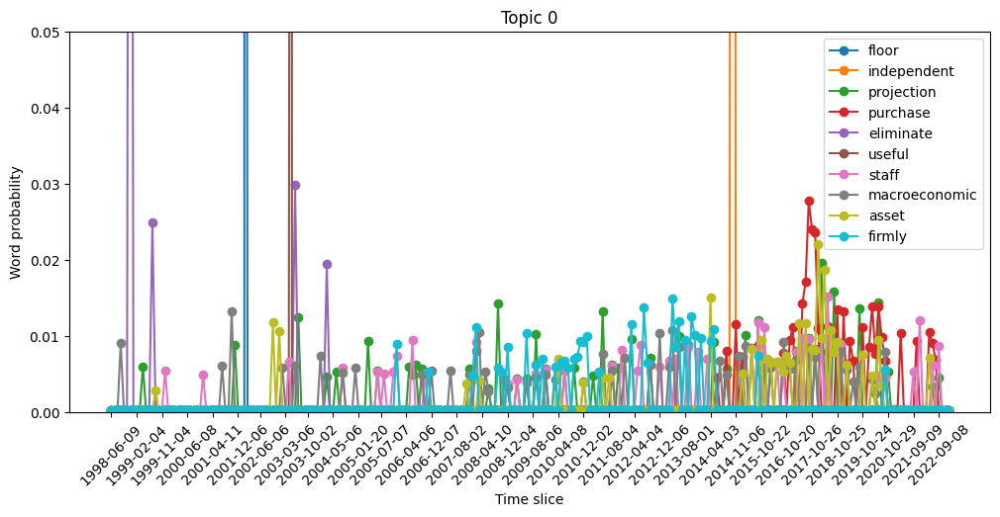

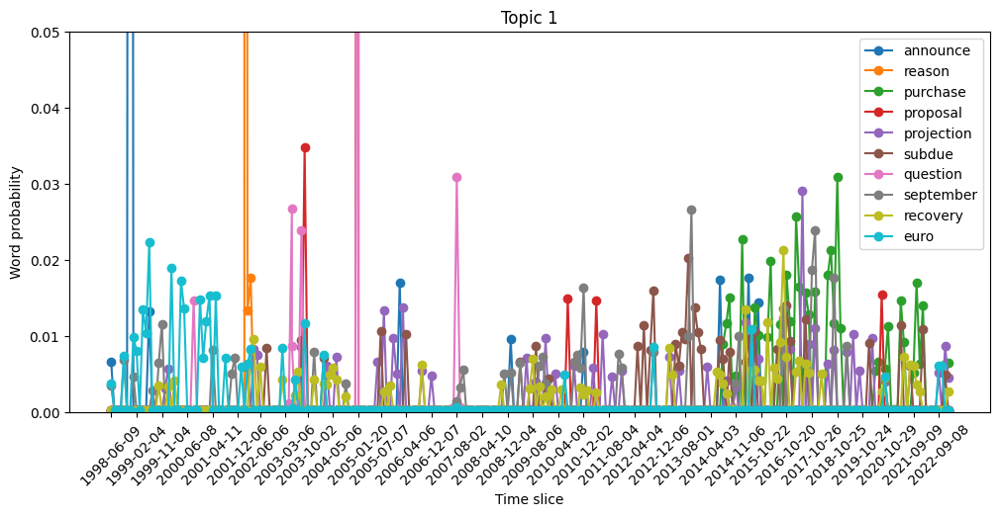

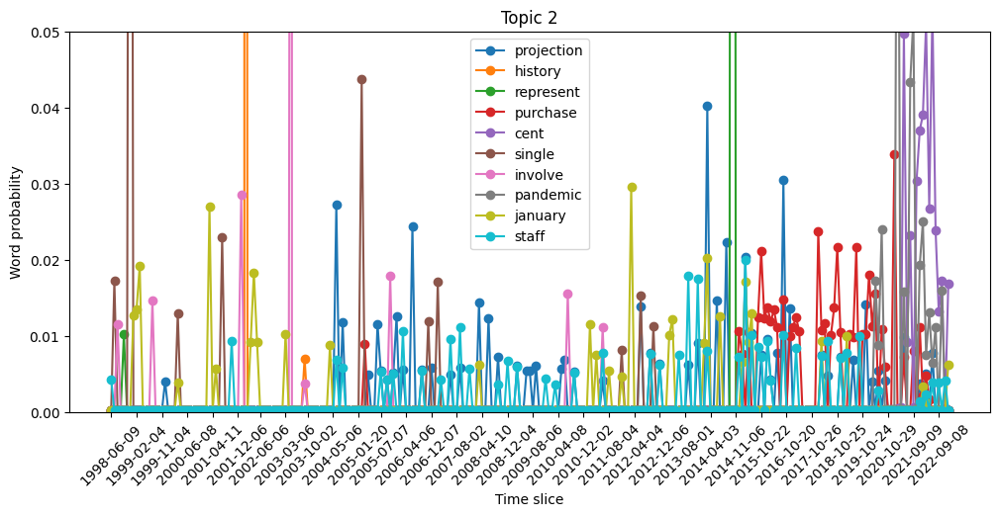

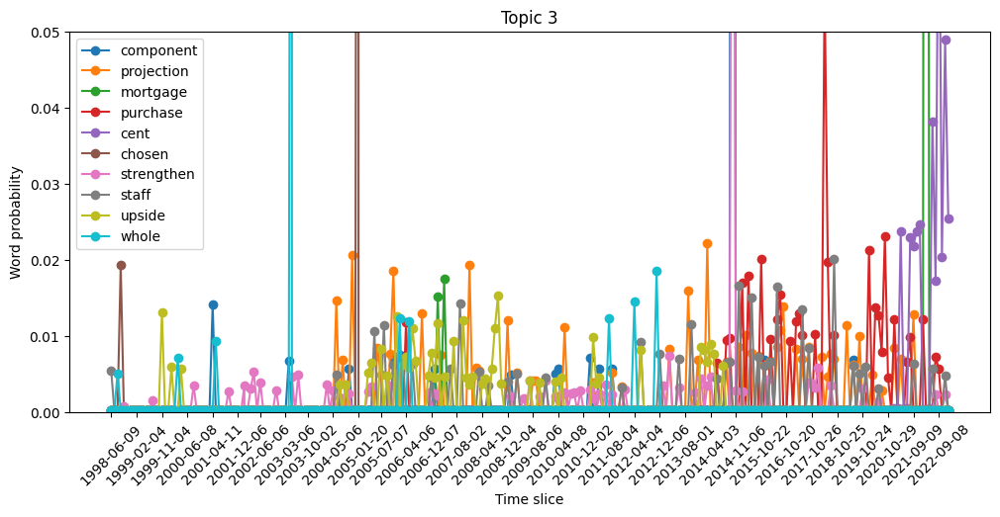

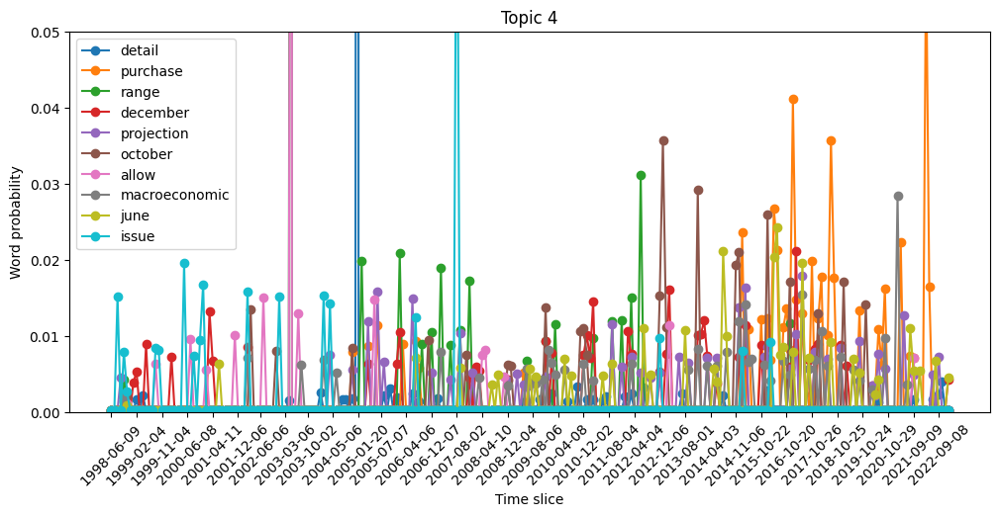

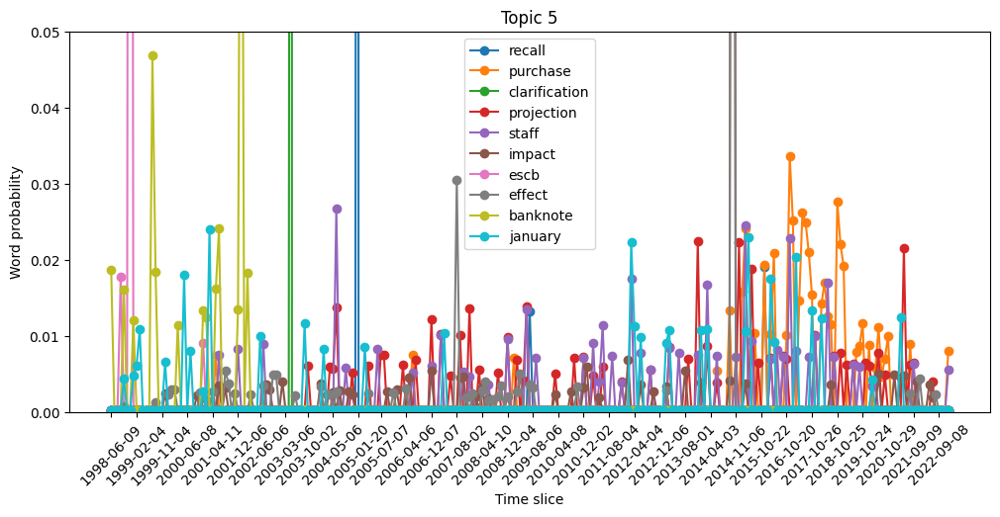

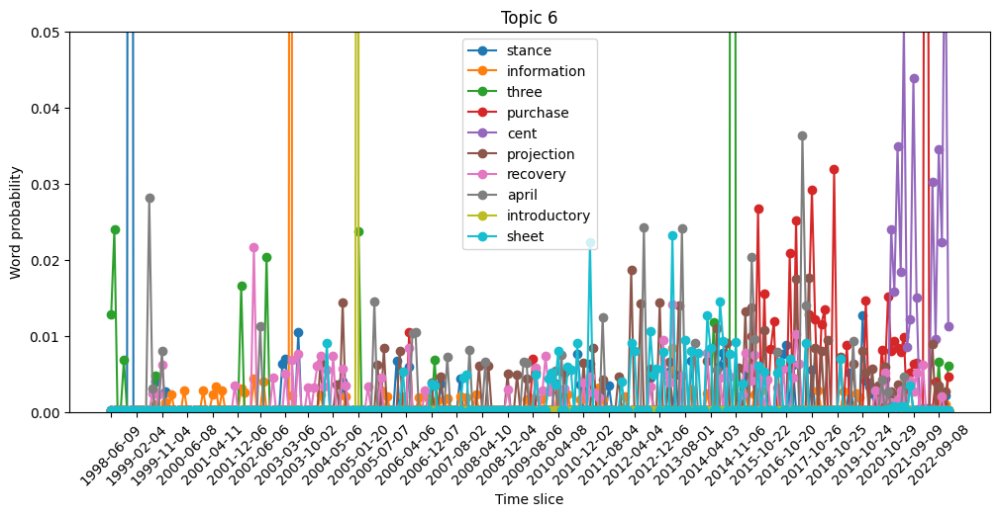

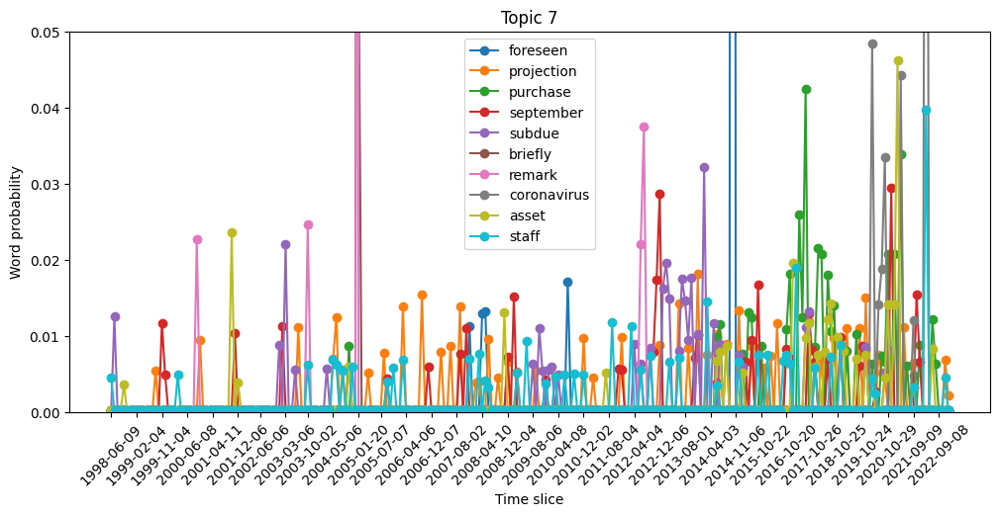

In [128]:
num_top_words = len(top_words[0])
num_timepoints = mdl.num_timepoints

# plot the evolution of word probabilities over time for each topic and word
for topic in range(num_topics):
    fig, ax = plt.subplots(figsize=(12, 5))
    for i in range(num_top_words):
        word = top_words[topic][i]
        topic_word_probs = []
        for timeslice in range(num_timepoints):
            topic_word_dist = mdl.get_topic_word_dist(topic, timeslice)
            word_index = list(mdl.vocabs).index(word)
            topic_word_probs.append(topic_word_dist[word_index])
        ax.plot(speech['Date'], topic_word_probs, label=f"{word}", marker='o', linestyle='-')
    ax.legend()
    ax.set_xlabel("Time slice")
    ax.set_ylabel("Word probability")
    ax.set_title(f"Topic {topic}")
    ax.set_ylim(0,0.05)
    ax.set_xticks(speech['Date'].astype(str)[::8])
    ax.set_xticklabels(speech['Date'][::8], rotation=45)
plt.show()


### Network analysis

In [89]:
# return the shape [num_timepoints, k]
mdl.get_count_by_topics().shape
# Return the number of words allocated to each timepoint for each topic
mdl.get_count_by_topics()[1].sum()

257

In [93]:
# correlation = {}
# time = 265
# for topic in range(mdl.k):
#     for other_topic in range(mdl.k):
#         if other_topic != topic:
#             correlation_matrix = np.corrcoef(mdl.get_topic_word_dist(topic, time), mdl.get_topic_word_dist(other_topic, time))
#             print(f"Correlation between Topic {topic} and Topic {other_topic} at time {time}: {correlation_matrix[0][1]}")
time = 265
correlation_dict = {}

for i in range(mdl.k):
    for j in range(i+1, mdl.k):
        corr = np.corrcoef(mdl.get_topic_word_dist(i, time), mdl.get_topic_word_dist(j, time))[0, 1]
        correlation_dict[(i,j)] = corr

correlation_dict

{(0, 1): 0.24341959043100383,
 (0, 2): 0.2493032562940797,
 (0, 3): 0.08472456937413617,
 (0, 4): 0.11020564498289721,
 (0, 5): 0.015515390125054531,
 (0, 6): 0.14064582410533344,
 (0, 7): 0.09159759178321196,
 (1, 2): 0.07565893246475854,
 (1, 3): 0.080475222841202,
 (1, 4): 0.14922442517616588,
 (1, 5): 0.01026488216526201,
 (1, 6): 0.21512787011370854,
 (1, 7): 0.038405943759721735,
 (2, 3): 0.06630612303962372,
 (2, 4): 0.3513014546560663,
 (2, 5): 0.011983267020028884,
 (2, 6): 0.08687433767730224,
 (2, 7): 0.04891953952423936,
 (3, 4): 0.05269963387783698,
 (3, 5): 0.027849231533388977,
 (3, 6): 0.10570913234874496,
 (3, 7): 0.15905444426343332,
 (4, 5): 0.048812546441716946,
 (4, 6): 0.1218838455499837,
 (4, 7): 0.02151828605227957,
 (5, 6): 0.012613140950334842,
 (5, 7): 0.07319452326482978,
 (6, 7): 0.11382040117779621}

In [111]:
correlation = pd.DataFrame.from_dict(correlation_dict, orient='index').reset_index().rename({'index':'node', 0:'edge'}, axis = 1)
correlation.node = correlation.node.apply(lambda x:list(x))
correlation.edge = correlation.edge*10
correlation.edge = correlation.edge.apply(lambda x:[x])
correlation['edges'] = correlation.node+correlation.edge
correlation

,node,edge,edges
0,"[0, 1]",[2.4341959043100383],"[0, 1, 2.4341959043100383]"
1,"[0, 2]",[2.493032562940797],"[0, 2, 2.493032562940797]"
2,"[0, 3]",[0.8472456937413617],"[0, 3, 0.8472456937413617]"
3,"[0, 4]",[1.1020564498289722],"[0, 4, 1.1020564498289722]"
4,"[0, 5]",[0.15515390125054532],"[0, 5, 0.15515390125054532]"
5,"[0, 6]",[1.4064582410533344],"[0, 6, 1.4064582410533344]"
6,"[0, 7]",[0.9159759178321196],"[0, 7, 0.9159759178321196]"
7,"[1, 2]",[0.7565893246475853],"[1, 2, 0.7565893246475853]"
8,"[1, 3]",[0.80475222841202],"[1, 3, 0.80475222841202]"
9,"[1, 4]",[1.4922442517616588],"[1, 4, 1.4922442517616588]"


In [112]:
net = Network(
    notebook=True,
    cdn_resources="remote",
    bgcolor="#222222",
    font_color="white",
     height="1000px",
    width="1200px",
)
nodes = list(range(0, 8))
edges = correlation.edges.tolist()
net.add_nodes(
    nodes,
    label=[
        "Topic 0",
        "Topic 1",
        "Topic 2",
        "Topic 3",
        "Topic 4",
        "Topic 5",
        "Topic 6",
        "Topic 7",
    ],
    color=["#3da831", "#FED049", "#F2921D", "#539165", "#D14D72", "#7AA874", "#93C6E7", "#FF884B"],
)
net.add_edges(edges)
net.show_buttons(filter_="physics")
net.show("network.html")

In [189]:
for timepoint in range(mdl.num_timepoints):
    topic_term_dists = np.stack(
        [mdl.get_topic_word_dist(k, timepoint=timepoint) for k in range(mdl.k)]
    )
    topic_term_dists /= topic_term_dists.sum(axis=1, keepdims=True)
    doc_topic_dists = np.stack(
        [doc.get_topic_dist() for doc in mdl.docs if doc.timepoint == timepoint]
    )
    doc_topic_dists /= doc_topic_dists.sum(axis=1, keepdims=True)
    doc_lengths = np.array(
        [len(doc.words) for doc in mdl.docs if doc.timepoint == timepoint]
    )
    vocab = list(mdl.used_vocabs)
    term_frequency = mdl.used_vocab_freq

    for k in range(mdl.k):
        print("Topic #{}".format(k), *(w for w, _ in mdl.get_topic_words(k, 0, top_n=10)))
        print(topic_dist_by_time[:, k])

Topic #0 organisational test escb article subsequent schedule inter produce item organise
[0.13888693 0.11828837 0.10762885 0.09747424 0.09579026 0.01437006
 0.12603621 0.16356984 0.16476825 0.14198077 0.15697108 0.13898611
 0.1491458  0.16785604 0.18152459 0.20268162 0.20823456 0.22614329
 0.11517857 0.14214829 0.12835342 0.11682607 0.12048215 0.08158821
 0.06481099 0.10275783 0.15449782 0.26157269 0.14573668 0.12170363
 0.11485442 0.19270568 0.16425239 0.11329944 0.11362504 0.13642703
 0.12640892 0.11230256 0.13740736 0.13619633 0.13561082 0.13059813
 0.19239432 0.12236843 0.25347373 0.11252385 0.12871943 0.14060362
 0.15770848 0.16750823 0.1060582  0.15253656 0.17993684 0.17702706
 0.18011636 0.12189671 0.13481984 0.11596837 0.12297169 0.00256685
 0.08290227 0.10770167 0.15640269 0.13958515 0.01659662 0.10187066
 0.13057475 0.15076843 0.13043906 0.09749841 0.1356041  0.12197279
 0.16916399 0.18113142 0.1565454  0.14752409 0.14701124 0.18237871
 0.160404   0.16981566 0.13673955 0.301

In [ ]:
# Plot DTM model
for timepoint in range(mdl.num_timepoints):
    topic_term_dists = np.stack(
        [mdl.get_topic_word_dist(k, timepoint=timepoint) for k in range(mdl.k)]
    )
    topic_term_dists /= topic_term_dists.sum(axis=1, keepdims=True)
    doc_topic_dists = np.stack(
        [doc.get_topic_dist() for doc in mdl.docs if doc.timepoint == timepoint]
    )
    doc_topic_dists /= doc_topic_dists.sum(axis=1, keepdims=True)
    doc_lengths = np.array(
        [len(doc.words) for doc in mdl.docs if doc.timepoint == timepoint]
    )
    vocab = list(mdl.used_vocabs)
    term_frequency = mdl.used_vocab_freq

    prepared_data = pyLDAvis.prepare(
        topic_term_dists,
        doc_topic_dists,
        doc_lengths,
        vocab,
        term_frequency,
        start_index=0,
        sort_topics=False,
    )
    pyLDAvis.save_html(prepared_data, "dtmvis_{}.html".format(timepoint))
